#### Calibrate Camera

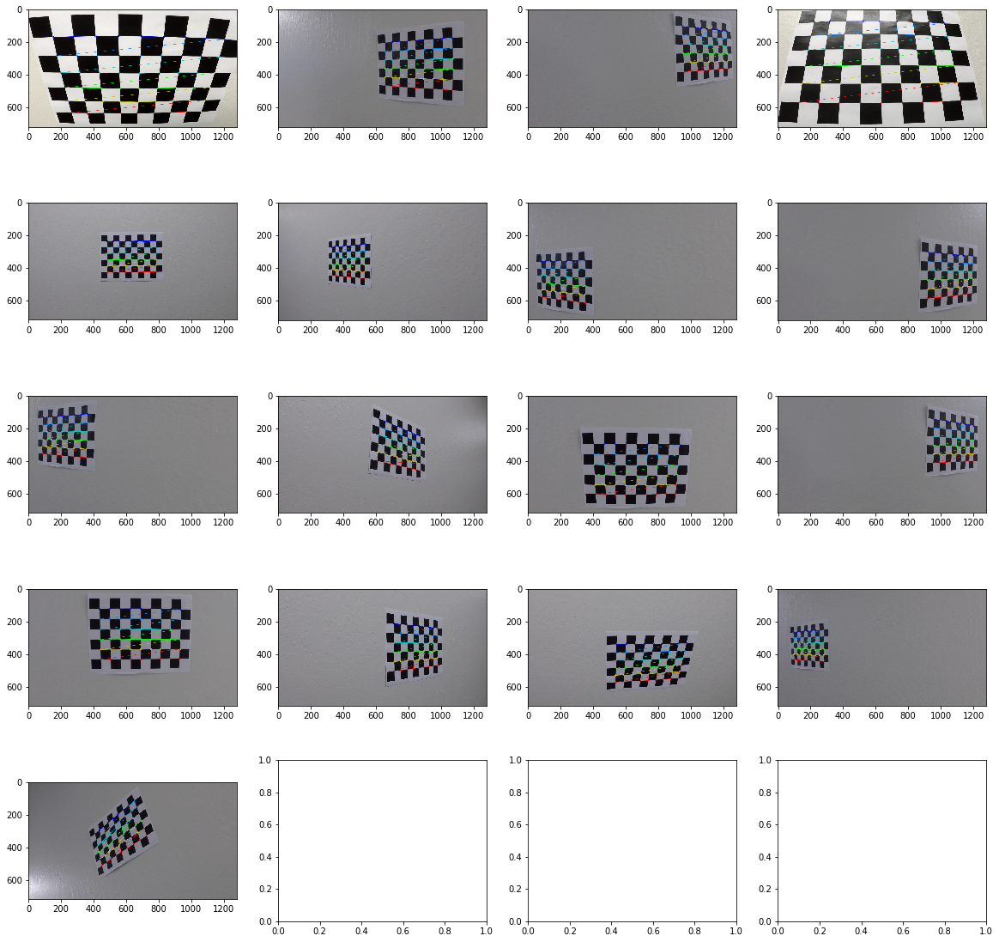

In [1]:
# camera calibration
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import pickle
%matplotlib inline

def display_images(images, nrows=5, ncols=4, figsize=(20,20)):
    f, axarr = plt.subplots(nrows, ncols, figsize=figsize)
    for idx, img in enumerate(images):
        # read in each image
        row = idx // ncols
        col = idx % ncols
        axarr[row, col].imshow(img)

# Read in and make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Arrays to store object points and image points from all the images
nx = 9
ny = 6

objpoints = []  # 3D points in real world space
imgpoints = []  # 2D points in image plane

# Prepare object points, like (0,0,0), (1,0,0), (2,0,0), ... , (7, 5, 0)
objp = np.zeros((ny*nx, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2) # x, y coordinates

images_to_display = []

for idx, fname in enumerate(images):
    # read in each image
    img = mpimg.imread(fname)

    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
 
    # If corners are found, add object points, image points
    if ret is True:
        imgpoints.append(corners)
        objpoints.append(objp)
        # draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        images_to_display.append(img)

display_images(images_to_display)
    
# save calibration as pickle
dist_dict = {"objpoints": objpoints, "imgpoints" : imgpoints}
pickle.dump(dist_dict, open("dist_dict.p", "wb"))

In [2]:
# helper function to visualize transformation
def display_transform(img, transformed_img, figsize=(20, 10), transform_text='Transformed image'):
    '''
    Function to compare original images with transformed image
    '''
    
    # Visualize perspective transform
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    ax1.set_title('Original image')
    ax1.imshow(img)
    ax2.set_title(transform_text)
    ax2.imshow(transformed_img)

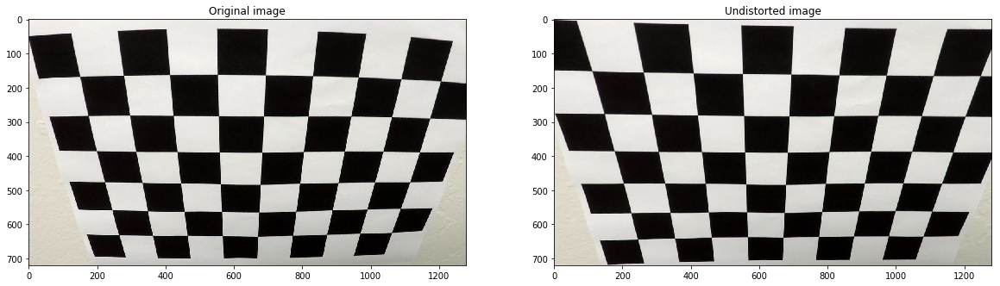

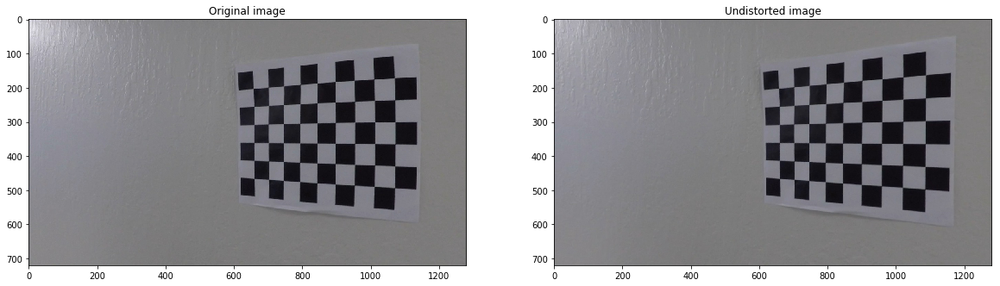

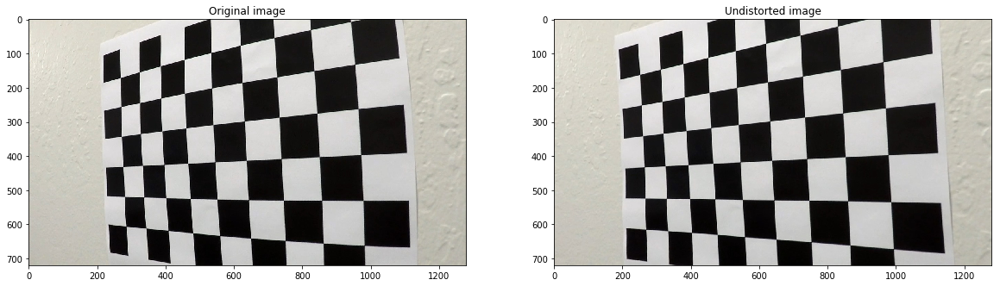

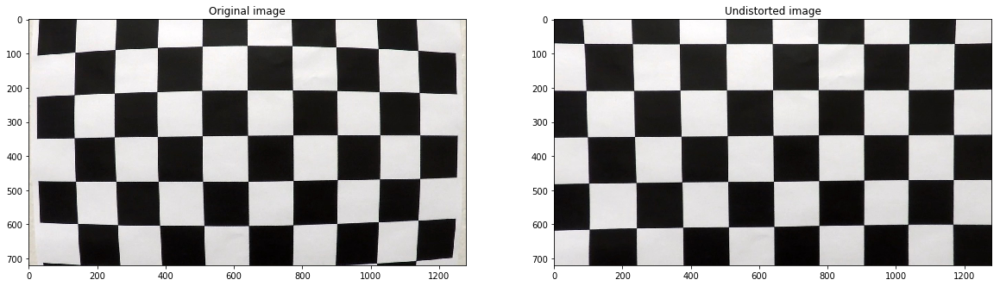

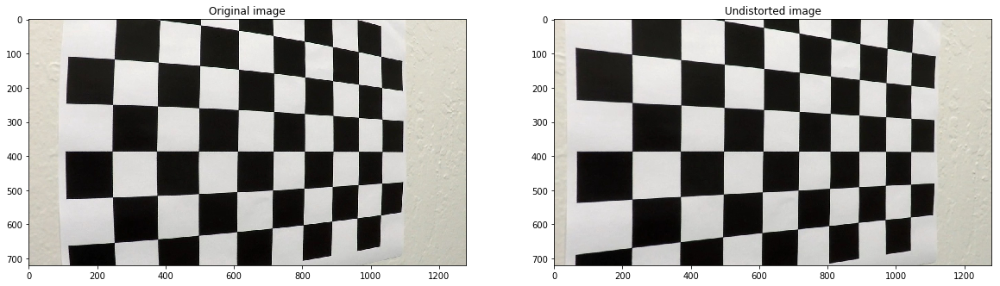

...

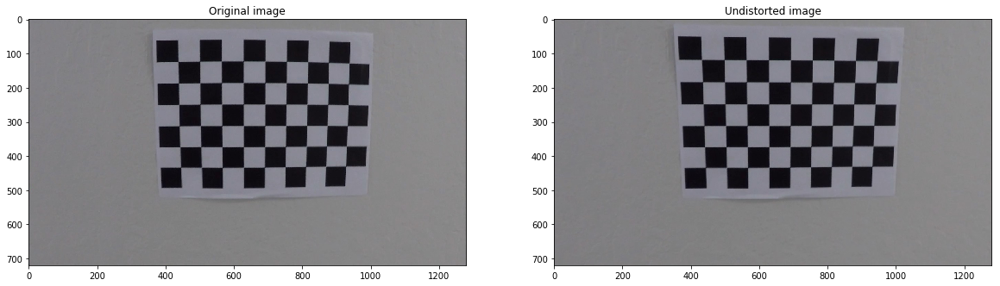

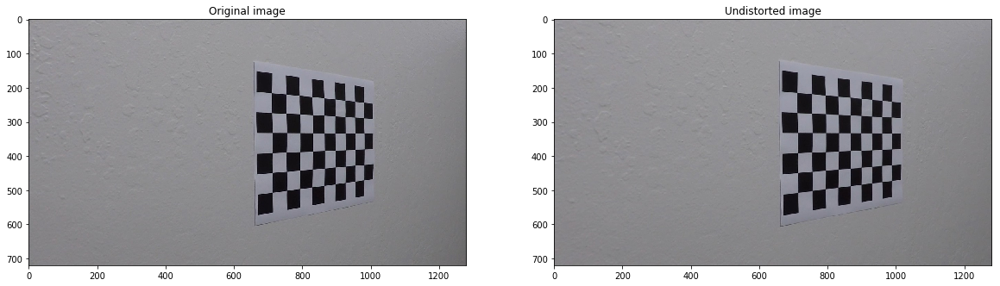

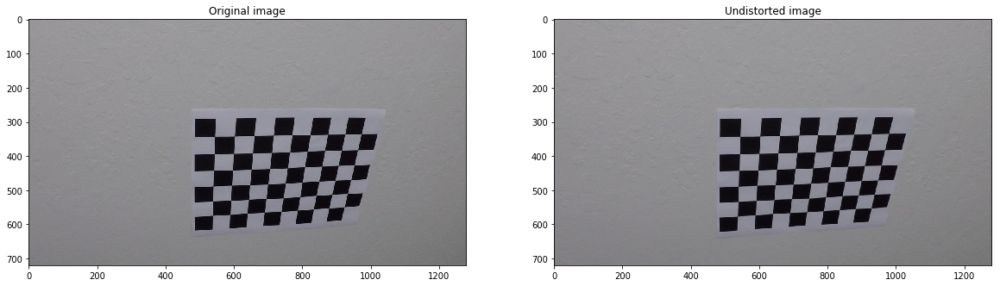

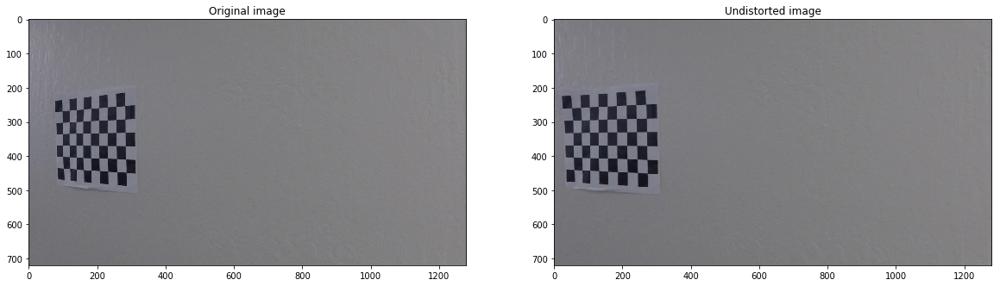

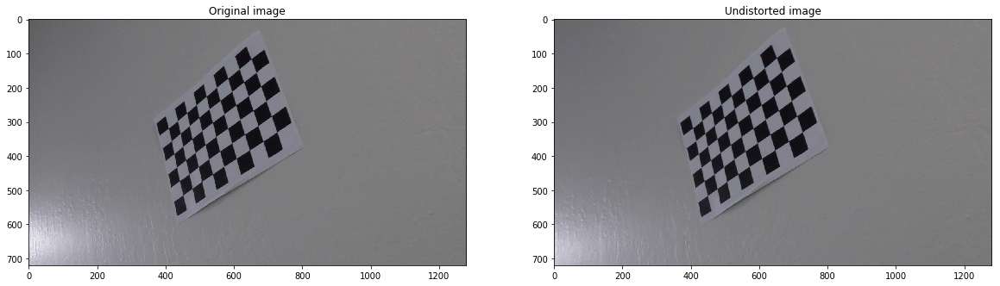

In [3]:
# visualize undistort on calibration images
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#Read in the saved objpoints and imgpoints
dist_pickle = pickle.load( open( "./dist_dict.p", "rb" ) )
objpoints = dist_pickle["objpoints"]
imgpoints = dist_pickle["imgpoints"]

# Read in and make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

def get_undistort_params(img, objpoints=objpoints, imgpoints=imgpoints):
    '''Calibrate camera and get parameters for performing image distortion correction
    '''
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return ret, mtx, dist, rvecs, tvecs

ret, mtx, dist, rvecs, tvecs = get_undistort_params(img) # cache image distortion correction parameters

def cal_undistort(img, mtx=mtx, dist=dist):
    ''' Takes an image and performs image distortion correction
    '''
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist
    
# Apply undistort to calibration images
for fname in images:
    img = mpimg.imread(fname)
    undistorted = cal_undistort(img)
    
    display_transform(img, undistorted, transform_text='Undistorted image')

#### Perspective Transform

(720, 1280, 3)


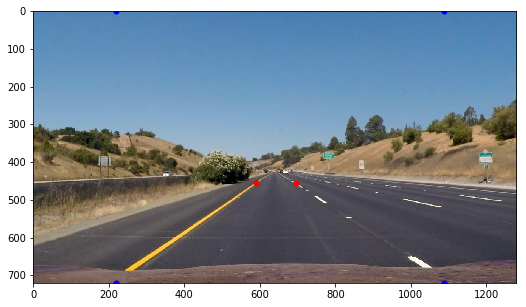

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
# source image points

# Read an image with straight lines to calibrate source and destination points
img = mpimg.imread('./test_images/straight_lines1.jpg')
print(img.shape)

src_pts = [[590, 455], [696, 455], [220, 719], [1088, 719]]
dst_pts = [[220, 0], [1088, 0], [220, 719], [1088, 719]]

plt.figure(figsize=(10,5))
plt.imshow(img)

# display source points in red
for pt in src_pts:
    plt.plot(pt[0], pt[1], 'o', markersize=5, color='r')
    
# display destination points in blue
for pt in dst_pts:
    plt.plot(pt[0], pt[1], 'o', markersize=5, color='b')

plt.show()

In [28]:
def get_warped_perspective(src_pts=src_pts, dst_pts=dst_pts):
    # Four source coordinate
    '''Helper function to get warped_perspective M and inverse Minv
    '''
    src = np.float32(src_pts)
    
    # Four desired coordinates
    dst = np.float32(dst_pts)
    
    # Compute the perspective transform, M
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Could compute the inverse also by swapping the input parameters
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

M, Minv = get_warped_perspective()

def warp(img, src_pts=src_pts, dst_pts=dst_pts, M=M):
    '''
    Takes image and transforms it to bird eye view (perspective transform)
    '''
    # Define calibration box in source (original) and destination (desired or warped) coordinates
    
    img_size = (img.shape[1], img.shape[0])
    
    # Create warped image - uses linear interpolation
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped

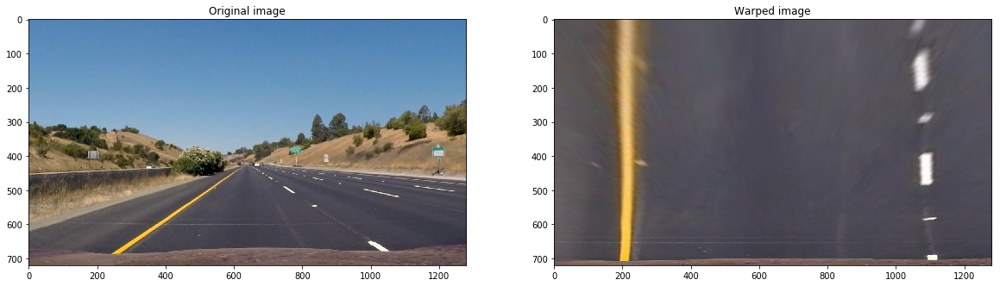

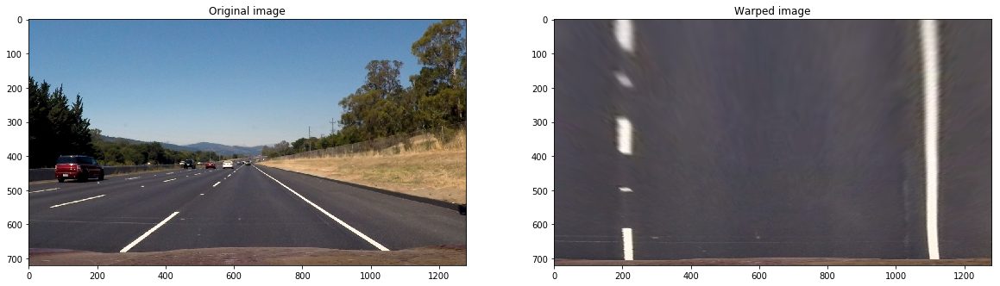

In [31]:
# Get perspective transform on straight line images
images = glob.glob('./test_images/straight_lines*.jpg')
for fname in images:
    img = mpimg.imread(fname)
    warped = warp(img)
    display_transform(img, warped, transform_text='Warped image')

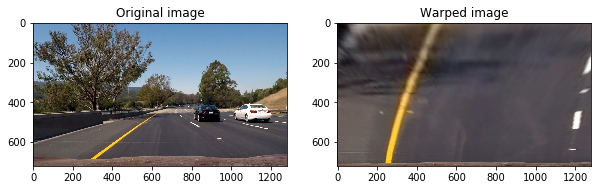

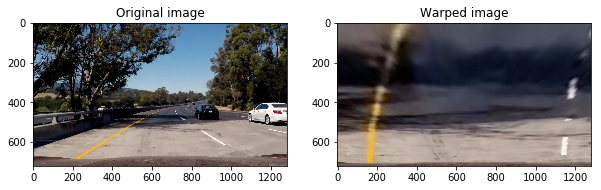

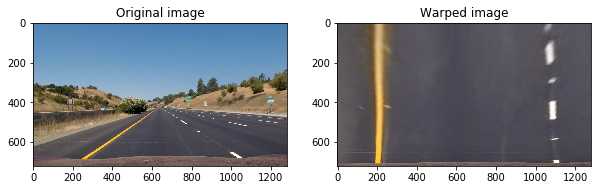

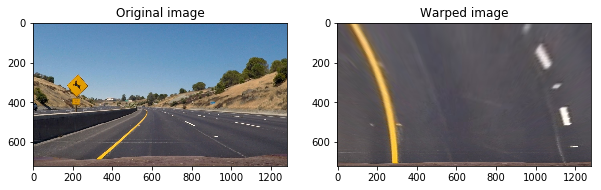

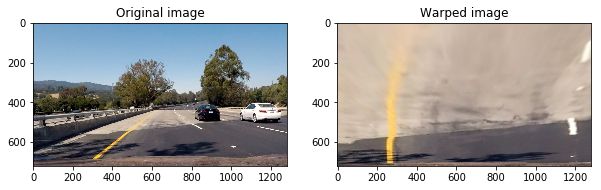

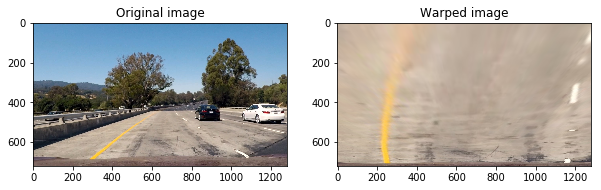

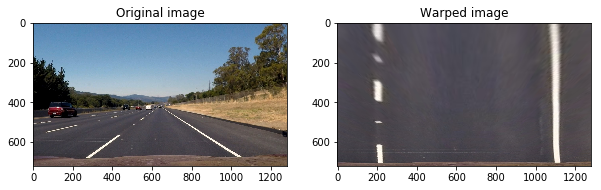

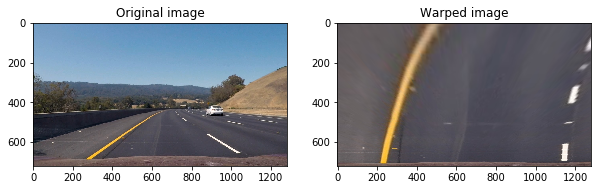

In [32]:
# Get perspective transform on all test images

# Read in and make a list of test images
images = glob.glob('./test_images/*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    warped = warp(img)
    display_transform(img, warped, figsize=(10, 5), transform_text='Warped image')

#### Color and Gradient Thresholding

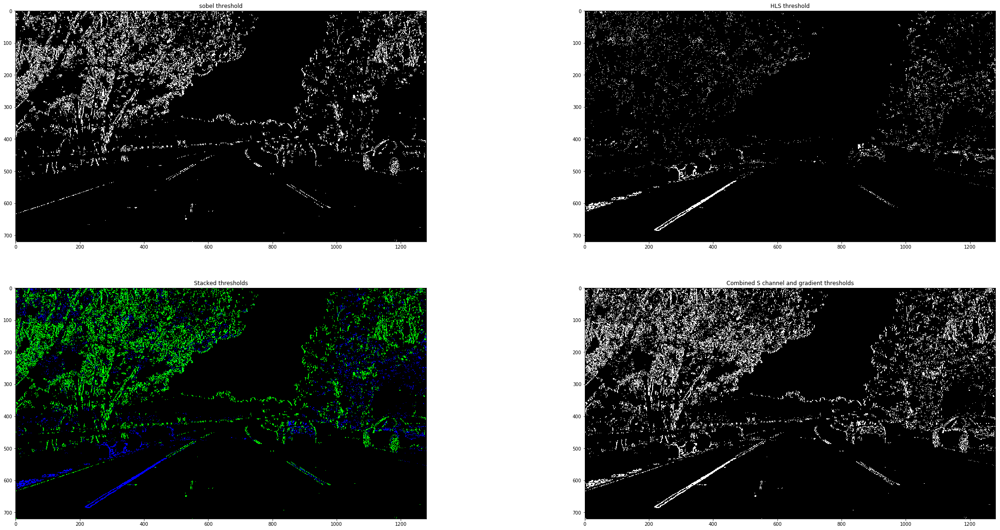

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# visualize HLS and sobel gradient separately

img = mpimg.imread('./test_images/test5.jpg')

# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
s_channel = hls[:,:,2]

# Grayscale image
# NOTE: we already saw that standard grayscaling lost color information for the lane lines
# Explore gradients in other colors spaces / color channels to see what might work better
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 30  # default: 20
thresh_max = 100  # default: 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Threshold color channel
s_thresh_min = 170  # default: 170
s_thresh_max = 220  # default: 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

# Plotting thresholded images
f, axs = plt.subplots(2, 2, figsize=(40,20))
axs[0, 0].set_title('sobel threshold')
axs[0, 0].imshow(sxbinary, cmap='gray')

axs[0, 1].set_title('HLS threshold')
axs[0, 1].imshow(s_binary, cmap='gray')

axs[1, 0].set_title('Stacked thresholds')
axs[1, 0].imshow(color_binary)

axs[1, 1].set_title('Combined S channel and gradient thresholds')
axs[1, 1].imshow(combined_binary, cmap='gray')

In [10]:
def apply_thresholds(img, sobel_thresholds=(thresh_min, thresh_max), hls_thresholds=(s_thresh_min, s_thresh_max)):
    '''Take combined thresholds from sobel and hls
    '''
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min , thresh_max = sobel_thresholds
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min, s_thresh_max = hls_thresholds
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    return combined_binary

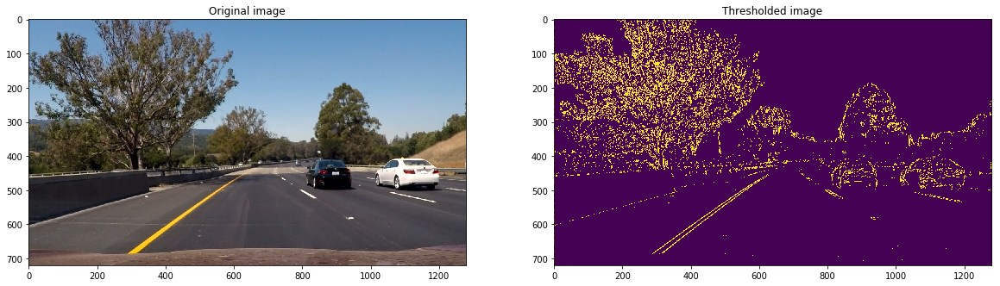

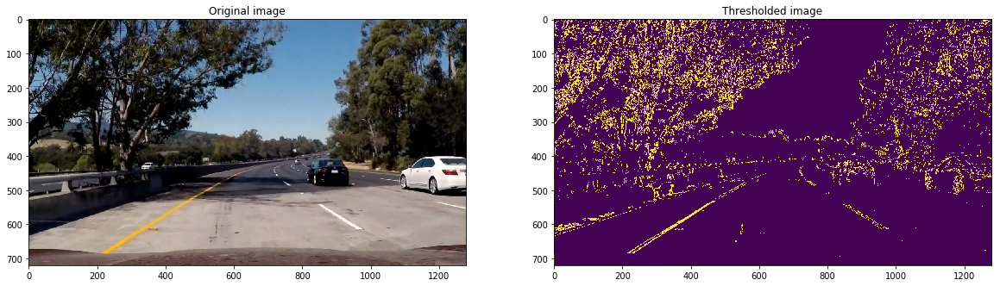

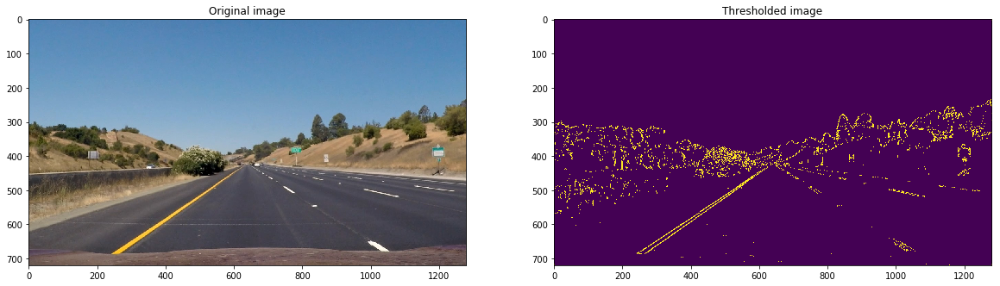

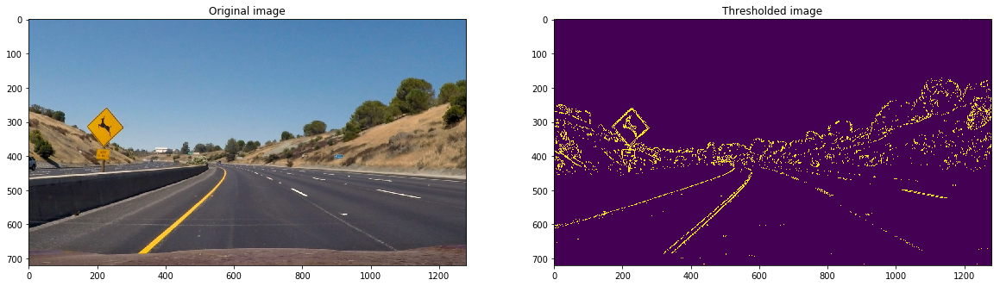

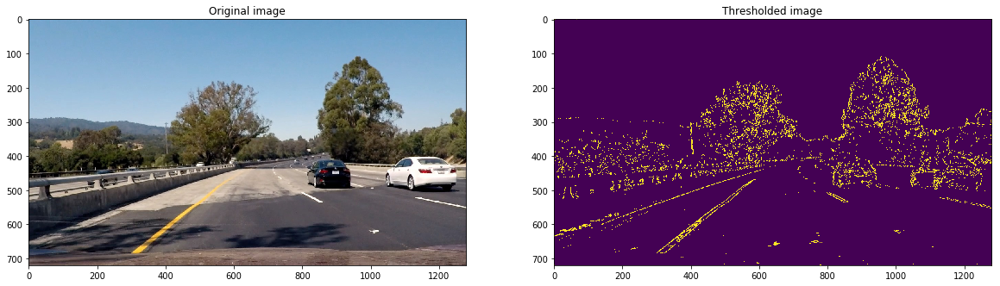

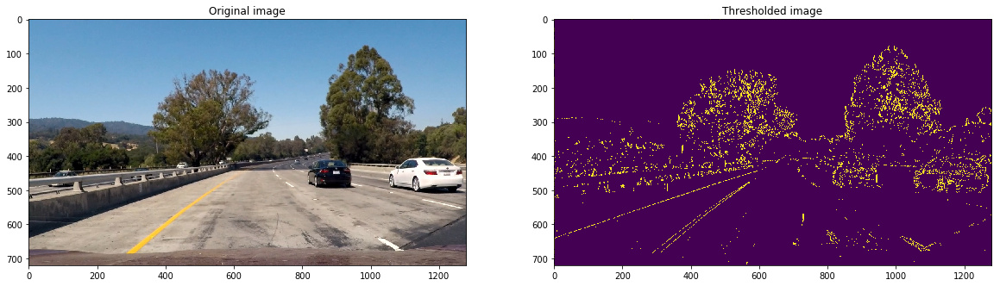

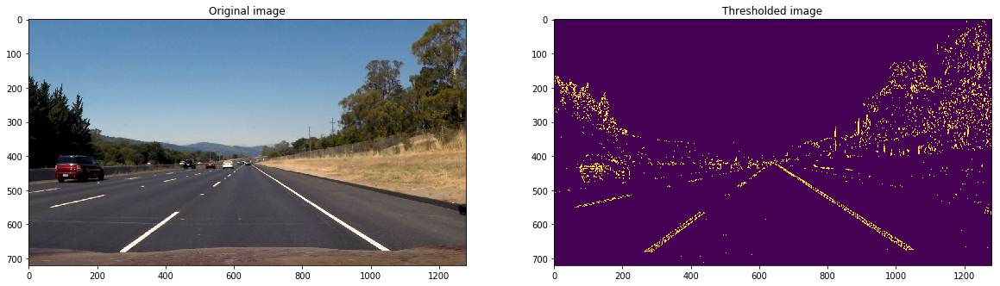

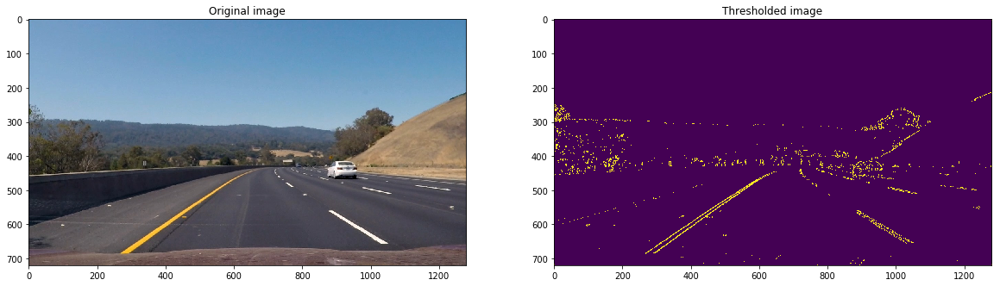

In [33]:
# Visualize threshold images

# Read in and make a list of test images
images = glob.glob('./test_images/*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    out_img = apply_thresholds(img)
    display_transform(img, out_img, transform_text='Thresholded image')

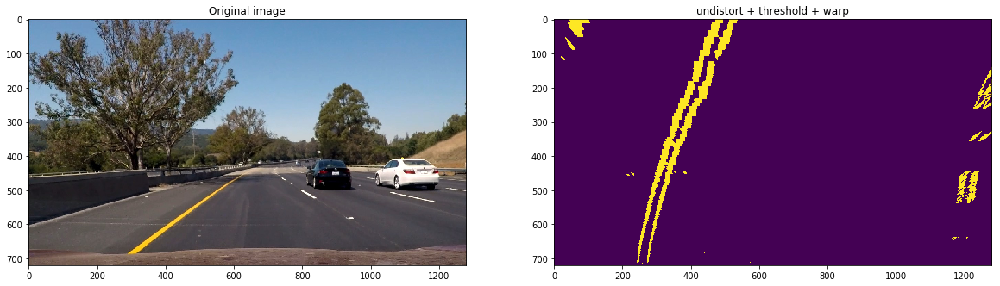

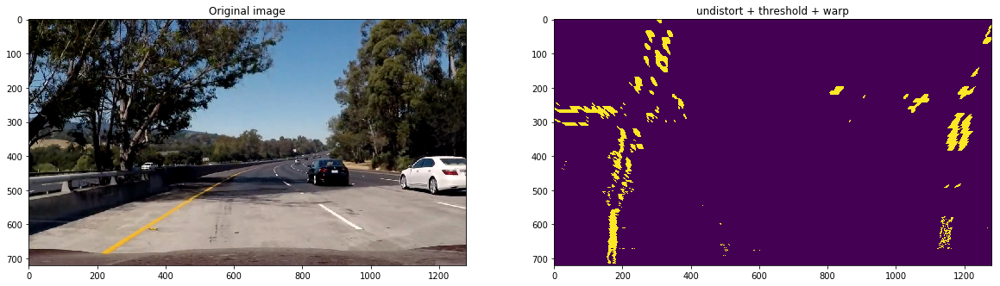

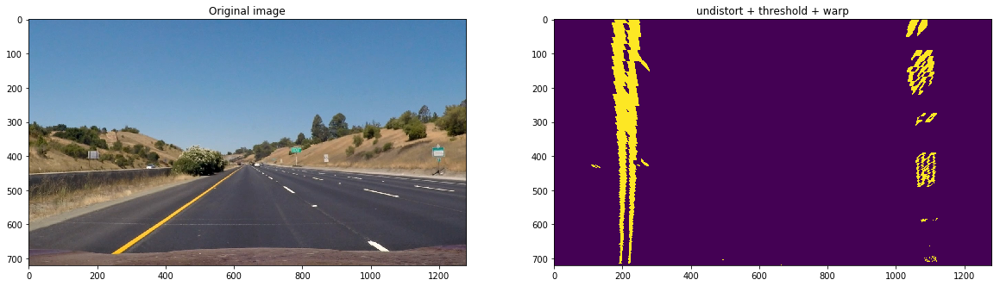

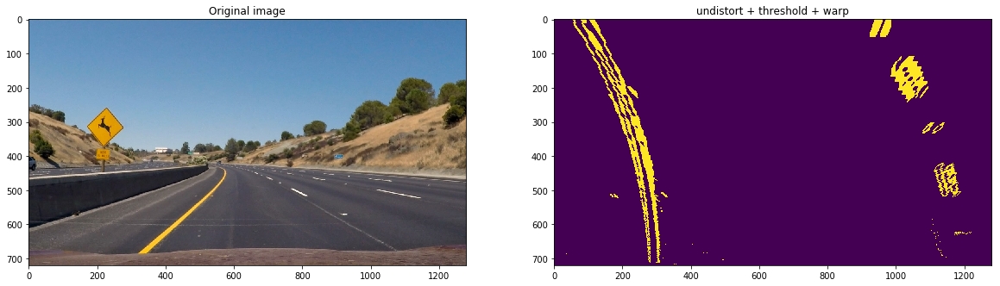

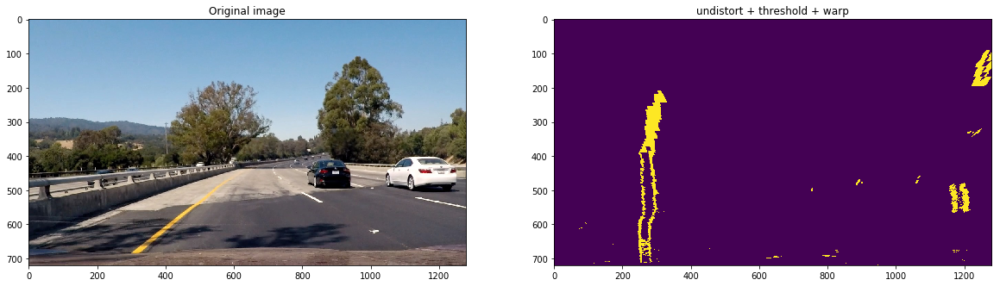

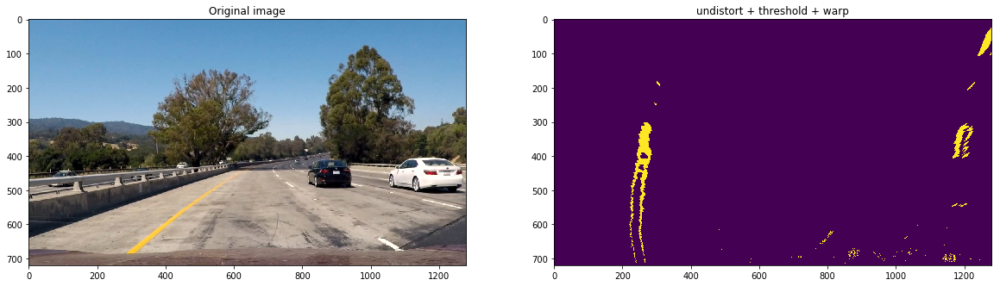

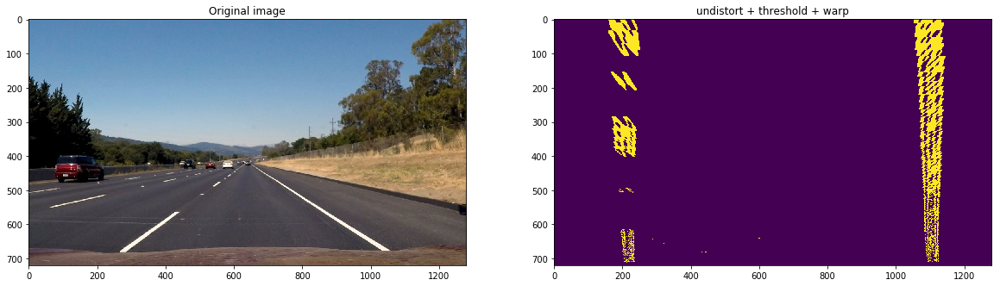

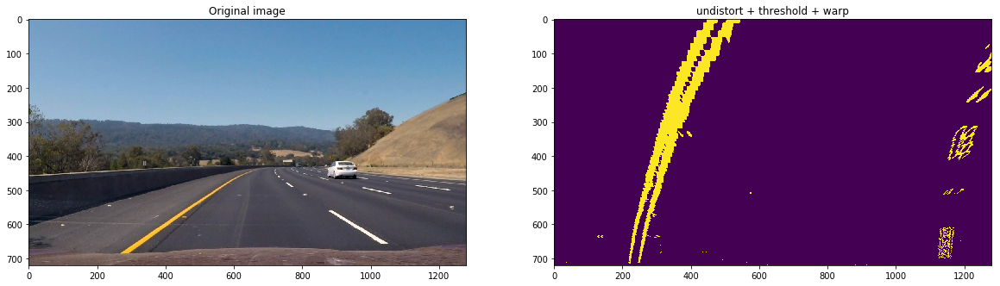

In [25]:
# Visualize undistort, threshold + warp for all test images

# Read in and make a list of test images
images = glob.glob('./test_images/*.jpg')

for fname in images:
    img = mpimg.imread(fname)
    out_img = warp(apply_thresholds((cal_undistort(img))))
    display_transform(img, out_img, transform_text='undistort + threshold + warp')

#### Lane Line Detection

In [34]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

In [35]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ''' Fit polynomials for left and right line, return x values for left and right lanes,
    along with y corresponding y values
    '''
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0]) # y values
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit, display=False):
    ''' Get lane lines by searching from prior
    '''
    # placeholder for optional output image
    out_img = None
    
    # The width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values
    ### within the +/- margin of our polynomial function
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    if display is True:
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return leftx, lefty, rightx, righty, out_img

In [36]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2

def find_lane_pixels(binary_warped, display=False):
    ''' get lane lines from scratch 
    '''
    # placeholder for optional output image
    out_img = None
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    if display is True:
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
 
    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        if display is True:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

# fit polynomial for visualization
def fit_polynomial(binary_warped, prior_left_fit=None, prior_right_fit=None, display=False):
    # Find our lane pixels first
    if prior_left_fit is None and prior_right_fit is None:
        # search from scratch
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped, display=display)
    else:
        # search around previous lines
        leftx, lefty, rightx, righty, out_img = search_around_poly(binary_warped, prior_left_fit, prior_right_fit, display=display)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
    if display is True:
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        ## Visualization ##
        if display is True:
        # Colors in the left and right lane regions
            out_img[lefty, leftx] = [255, 0, 0]
            out_img[righty, rightx] = [0, 0, 255]

            # Plots the left and right polynomials on the lane lines
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')

    return ploty, left_fit, right_fit, out_img

def get_polynomial_real(left_fit, right_fit, ym_per_pix=ym_per_pix, xm_per_pix=xm_per_pix):
    ''' get real polynomial coefficients from pixel polynomial coefficients
    '''
    left_fit_m = left_fit.copy()
    right_fit_m = right_fit.copy()
    
    left_fit_m[0] = left_fit[0]*(xm_per_pix)/(ym_per_pix**2)
    left_fit_m[1] = left_fit[1]*xm_per_pix/ym_per_pix
    left_fit_m[2] = left_fit[2]*xm_per_pix
    
    right_fit_m[0] = right_fit[0]*(xm_per_pix)/(ym_per_pix**2)
    right_fit_m[1] = right_fit[1]*xm_per_pix/ym_per_pix
    right_fit_m[2] = right_fit[2]*xm_per_pix
    
    return left_fit_m, right_fit_m


def fit_polynomial_real(binary_warped, ym_per_pix=ym_per_pix, xm_per_pix=xm_per_pix):
    '''get real polynomial coefficients from find_lane_pixels(binary_warped)'''
    # Find lane pixels
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    # Fit a second order polynomial to each using 'np.polyfit'
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    return left_fit_m, right_fit_m

In [37]:
# Load our image
img = mpimg.imread('./test_images/straight_lines1.jpg')
binary_warped = apply_thresholds(warp(img))

ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped, display=False)

# check if two versions of function that get real polynomial coefficients give similar values
left_fit_m, right_fit_m = fit_polynomial_real(binary_warped)
left_fit_m2, right_fit_m2 = get_polynomial_real(left_fit, right_fit)
print(left_fit_m, left_fit_m2)
print(right_fit_m, right_fit_m2)

[ -1.98626719e-04   8.43183983e-03   1.02921368e+00] [ -1.98626719e-04   8.43183983e-03   1.02921368e+00]
[ -5.57376261e-05   9.91645592e-03   5.58673465e+00] [ -5.57376261e-05   9.91645592e-03   5.58673465e+00]


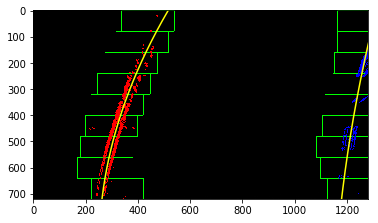

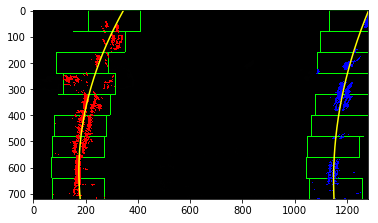

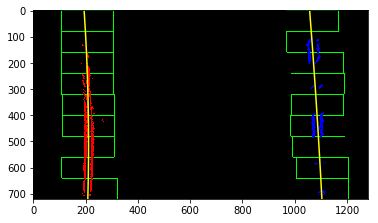

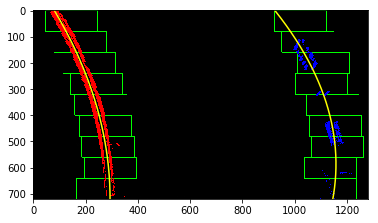

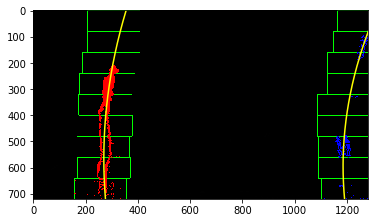

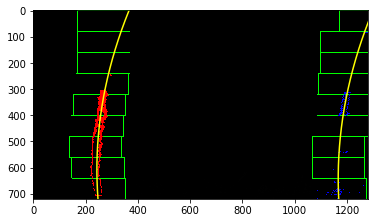

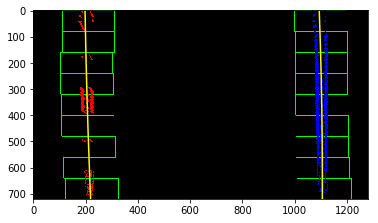

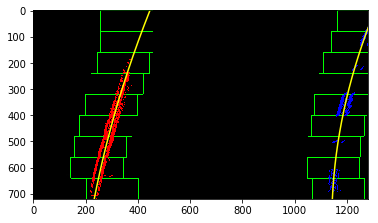

In [38]:
# Get polynomial fitting for all test images

# Read in and make a list of test images
images = glob.glob('./test_images/*.jpg')

for fname in images:
    f = plt.figure()
    img = mpimg.imread(fname)
    binary_warped = apply_thresholds(warp(img))
    _, _, _, out_img = fit_polynomial(binary_warped, display=True)
    plt.imshow(out_img)

In [39]:
import numpy as np
    
def measure_curvature_real(left_fit_m, right_fit_m, y_eval=719):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_m[0]*y_eval*ym_per_pix + left_fit_m[1])**2)**1.5) / np.absolute(2*left_fit_m[0])
    right_curverad = ((1 + (2*right_fit_m[0]*y_eval*ym_per_pix + right_fit_m[1])**2)**1.5) / np.absolute(2*right_fit_m[0])
    
    return left_curverad, right_curverad

12000.1663907 m 96.9292257326 m
42521.0224917 m 15395.2246597 m
3422.67761384 m 137.54196257 m
25081.1926697 m 78895.7917782 m
12770.9081979 m 33348.7442612 m
15794.0812136 m 17731.8935982 m
269.714699413 m 167.35580004 m
1730.66519937 m 8017.3703728 m


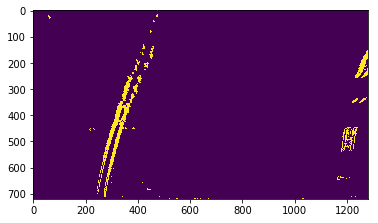

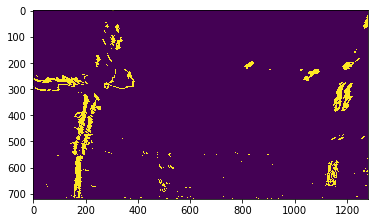

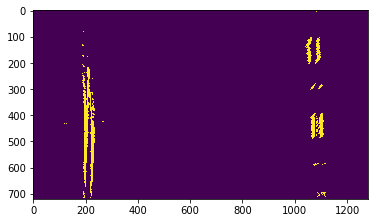

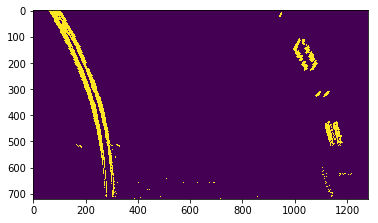

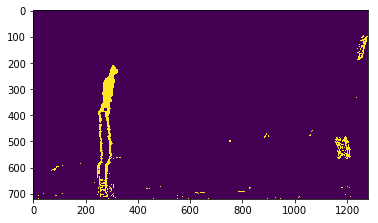

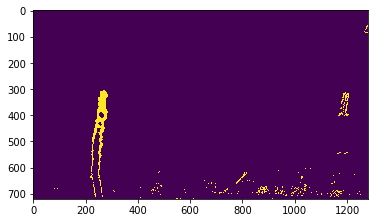

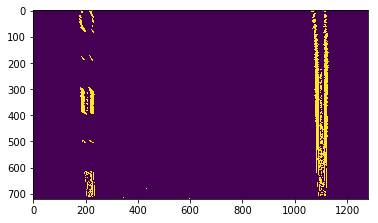

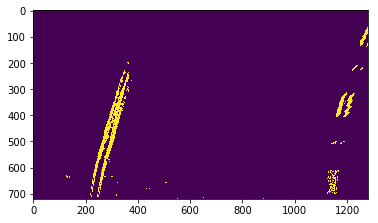

In [41]:
# Get curvature of test images

# Read in and make a list of test images
images = glob.glob('./test_images/*.jpg')

for fname in images:
    f = plt.figure()
    img = mpimg.imread(fname)
    binary_warped = apply_thresholds(warp(cal_undistort(img)))
    left_fit_cr, right_fit_cr = fit_polynomial_real(binary_warped, xm_per_pix, ym_per_pix)
    
    # Calculate the radius of curvature in meters for both lane lines
    left_curverad, right_curverad = measure_curvature_real(left_fit_cr, right_fit_cr)
    plt.imshow(binary_warped)
    print(left_curverad, 'm', right_curverad, 'm')

#### Projecting Lane Lines, Curvature and Offset

In [42]:
def project_lines(image, binary_warped, left_fit, right_fit, ploty, Minv=Minv):
    '''Project lines onto image'''
    color_warp = np.dstack((binary_warped, binary_warped, binary_warped))
    
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    return result

In [43]:
def project_curvature(image, left_fit, right_fit):
    left_fit_m, right_fit_m = get_polynomial_real(left_fit, right_fit)
    left_curverad, right_curverad = measure_curvature_real(left_fit_m, right_fit_m)
    left_curverad_text = "left curvature radius: %f m" % left_curverad
    right_curverad_text = "right curvature radius: %f m" % right_curverad
    cv2.putText(image, left_curverad_text, org=(50,100), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1,
                color=(255,255,255), thickness=3)
    cv2.putText(image, right_curverad_text, org=(50,150), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1,
                color=(255,255,255), thickness=3)

In [47]:
def project_offset2(image, left_fit, right_fit,  xm_per_pix=xm_per_pix, ym_per_pix=ym_per_pix):
    left_fit_m, right_fit_m = get_polynomial_real(left_fit, right_fit)
    y_eval_m = (image.shape[0]-1) * ym_per_pix
    
    left_pos = left_fit_m[0]*y_eval_m**2 + left_fit_m[1]*y_eval_m + left_fit_m[2]
    right_pos = right_fit_m[0]*y_eval_m**2 + right_fit_m[1]*y_eval_m + right_fit_m[2]
    
    lane_center_pos = left_pos + (right_pos - left_pos) / 2
    car_center_pos = ((image.shape[1]-1) * xm_per_pix) / 2
    
    offset = car_center_pos - lane_center_pos
    offset_text = 'offset from center: %f m' % offset
    cv2.putText(image, offset_text, org=(50,200), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1,
                color=(255,255,255), thickness=3)
    
def project_offset(image, left_fit, right_fit,  xm_per_pix=xm_per_pix, ym_per_pix=ym_per_pix):
    y_max = image.shape[0]-1
    x_max = image.shape[1]-1
    
    left_pos = left_fit[0]*y_max**2 + left_fit[1]*y_max + left_fit[2]
    right_pos = right_fit[0]*y_max**2 + right_fit[1]*y_max + right_fit[2]
    
    lane_center_pos = left_pos + (right_pos - left_pos) / 2
    car_center_pos = x_max / 2
    
    offset = (car_center_pos - lane_center_pos) * xm_per_pix
    offset_text = 'offset from center: %f m' % offset
    cv2.putText(image, offset_text, org=(50,200), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1,
                color=(255,255,255), thickness=3)

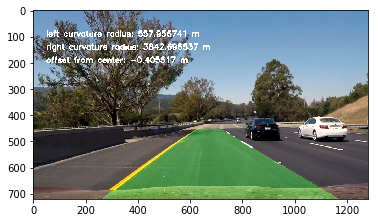

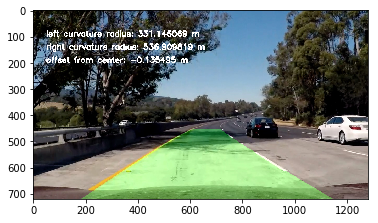

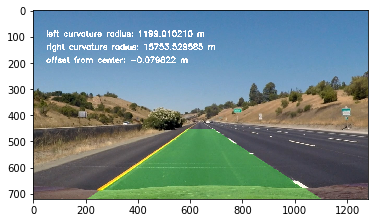

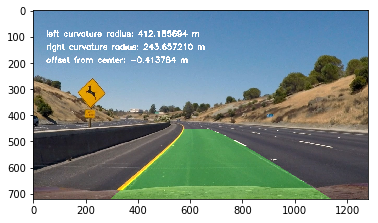

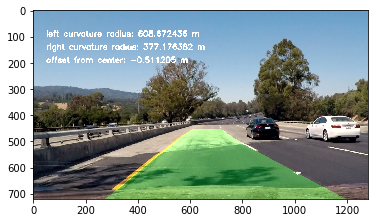

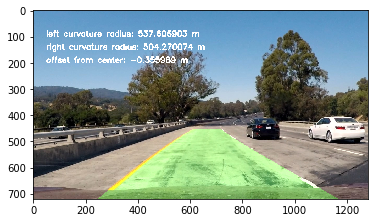

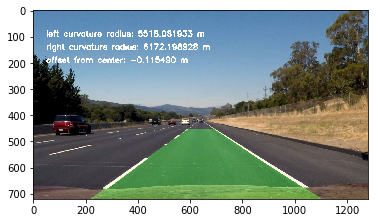

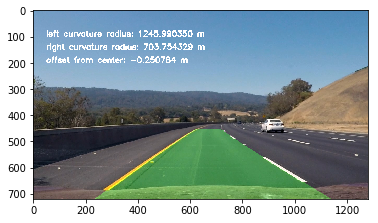

In [48]:
# Get polynomial fitting for all test images
# Include curvature and offset

# Read in and make a list of test images and straight line images
images = glob.glob('./test_images/*.jpg')

for fname in images:
    f = plt.figure()
    img = mpimg.imread(fname)
    binary_warped = apply_thresholds(warp(cal_undistort(img)))
    ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped)
    project_curvature(img, left_fit, right_fit)
    project_offset(img, left_fit, right_fit)
    plt.imshow(project_lines(img, binary_warped, left_fit, right_fit, ploty))

#### Line class to store state

In [60]:
# Define a class to receive the characteristics of each line detection

TOLERANCE = 5
N_SMOOTH = 10
N_DROP = 5
class Line():
    def __init__(self):
        self.left_fit_list = [] # cache previous left fit lines
        self.right_fit_list = [] # cache previous right fit lines
        self.drop_count = 0 # number of consecutive drops

    def get_average_left_fit(self):
        if not self.left_fit_list:
            return None
        return np.mean(self.left_fit_list, axis=0)
    
    def get_average_right_fit(self):
        if not self.right_fit_list:
            return None
        return np.mean(self.right_fit_list, axis=0)
        
    def process_image(self, image):
        binary_warped = apply_thresholds(warp(cal_undistort(image)))
        prior_left_fit = None
        prior_right_fit = None
        if self.left_fit_list and self.right_fit_list:
            prior_left_fit = self.get_average_left_fit()
            prior_right_fit = self.get_average_right_fit()
            
        ploty, left_fit, right_fit, out_img = fit_polynomial(binary_warped, prior_left_fit, prior_right_fit)
        

        # Decide whether to append lines to buffer/cache or drop
        if prior_left_fit is not None and \
        np.absolute(left_fit[0] - prior_left_fit[0]) < np.absolute(TOLERANCE * prior_left_fit[0]) and \
        np.absolute(left_fit[1] - prior_left_fit[1]) < np.absolute(TOLERANCE * prior_left_fit[1]) and \
        np.absolute(left_fit[2] - prior_left_fit[2]) < np.absolute(TOLERANCE * prior_left_fit[2]) and \
        prior_right_fit is not None and \
        np.absolute(right_fit[0] - prior_right_fit[0]) < np.absolute(TOLERANCE * prior_right_fit[0]) and \
        np.absolute(right_fit[1] - prior_right_fit[1]) < np.absolute(TOLERANCE * prior_left_fit[1]) and \
        np.absolute(right_fit[2] - prior_right_fit[2]) < np.absolute(TOLERANCE * prior_right_fit[2]):
            # append if within tolerance of average of previous lines
            self.left_fit_list.append(left_fit)
            self.right_fit_list.append(right_fit)
        elif prior_left_fit is None and prior_right_fit is None:
            # apped (searched from scratch) if no previous lines cached
            self.left_fit_list.append(left_fit)
            self.right_fit_list.append(right_fit)
        else:
            # drop if fall outside of tolerance
            self.drop_count += 1
            
        left_fit_ave = self.get_average_left_fit()
        right_fit_ave = self.get_average_right_fit()
        
        left_fit_m, right_fit_m = get_polynomial_real(left_fit_ave, right_fit_ave)
        left_curverad, right_curverad = measure_curvature_real(left_fit_m, right_fit_m)
        
        if self.drop_count == N_DROP:
            # too many consecutive drops
            self.left_fit_list = []
            self.right_fit_list = []
            self.drop_count = 0 # reset count
        
        # limit number of cached lines
        if len(self.left_fit_list) > N_SMOOTH and len(self.right_fit_list) > N_SMOOTH:
            self.left_fit_list.pop(0)
            self.right_fit_list.pop(0)
            
        # print curvature and offset
        project_curvature(image, left_fit_ave, right_fit_ave)
        project_offset(image, left_fit_ave, right_fit_ave)
        
        return project_lines(image, binary_warped, left_fit_ave, right_fit_ave, ploty)

#### Video Processing

In [61]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import os

if not os.path.isdir('test_videos_output'):
    os.mkdir('test_videos_output')

In [62]:
video_output = 'output_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("project_video.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
line = Line()
white_clip = clip1.fl_image(line.process_image) #NOTE: this function expects color images
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output_video.mp4
[MoviePy] Writing video output_video.mp4


100%|█████████▉| 1260/1261 [03:16<00:00,  6.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_video.mp4 

CPU times: user 33min 31s, sys: 18.8 s, total: 33min 49s
Wall time: 3min 17s
